# IMERG 2023-2024: Download, Crop Vietnam và EDA

Notebook này tải dữ liệu IMERG Final Run half-hourly (`GPM_3IMERGHH`, V07), cắt theo phạm vi Việt Nam, lưu thành một NetCDF và thực hiện EDA phục vụ rainfall nowcasting.

> **Lưu ý:** Cần tài khoản NASA Earthdata. Khoảng 2023-2024 có khoảng 35 nghìn timestep 30 phút; hãy kiểm tra dung lượng ổ đĩa trước khi bật tải.

In [2]:
# Chạy cell này đầu tiên trong Google Colab.
# Cell sẽ tự cài các package cần thiết nếu đang chạy trên Colab.
import sys
import subprocess
import shutil
from pathlib import Path

if "google.colab" in sys.modules:
    subprocess.check_call([
        sys.executable,
        "-m",
        "pip",
        "install",
        "-q",
        "xarray",
        "netCDF4",
        "h5netcdf",
        "h5py",
        "dask",
        "earthaccess",
        "pandas",
        "numpy",
        "matplotlib",
        "seaborn",
    ])

import warnings

import h5py
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore", category=RuntimeWarning)
sns.set_theme(style="whitegrid")

# Tự mount Google Drive khi chạy trên Colab.
try:
    from google.colab import drive

    drive.mount("/content/drive")
    IN_COLAB = True
    BASE_DIR = Path("/content/drive/MyDrive/Rainfall_Nowcasting/IMERG")
except ImportError:
    IN_COLAB = False
    BASE_DIR = Path.cwd().resolve()

# Khoảng thời gian: end là mốc loại trừ.
START = "2023-01-01T00:00:00"
END = "2025-01-01T00:00:00"

# Bounding box Việt Nam: west, south, east, north.
VN_BBOX = (102.0, 8.0, 110.0, 24.5)

# Đặt True khi đã sẵn sàng tải dữ liệu từ NASA Earthdata.
RUN_DOWNLOAD = True

RAW_DIR = BASE_DIR / "data" / "imerg_raw"
PROCESSED_DIR = BASE_DIR / "data" / "imerg_vietnam"
FIG_DIR = BASE_DIR / "figures"
VN_FILE = PROCESSED_DIR / "imerg_vietnam_2023_2024.nc"

for directory in (RAW_DIR, PROCESSED_DIR, FIG_DIR):
    directory.mkdir(parents=True, exist_ok=True)

# Xóa raw từ lần tải lỗi trước; giữ nguyên NetCDF đã crop để resume.
if RUN_DOWNLOAD and RAW_DIR.exists() and any(RAW_DIR.iterdir()):
    shutil.rmtree(RAW_DIR)
    RAW_DIR.mkdir(parents=True, exist_ok=True)
    print("Cleared old raw files from the failed download.")

print(f"Running in Colab: {IN_COLAB}")
print(f"Persistent data directory: {BASE_DIR}")
print(f"Output: {VN_FILE}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Running in Colab: True
Persistent data directory: /content/drive/MyDrive/Rainfall_Nowcasting/IMERG
Output: /content/drive/MyDrive/Rainfall_Nowcasting/IMERG/data/imerg_vietnam/imerg_vietnam_2023_2024.nc


## 1. Tìm và tải granule IMERG

`earthaccess` dùng Earthdata Login để tìm đúng collection và tải các file half-hourly. Tải theo granule giúp notebook có thể chạy lại; file đã tồn tại sẽ được bỏ qua bởi bước xử lý phía sau.

In [2]:
import gc
import json
import re
import shutil
import time

import earthaccess
from netCDF4 import Dataset, date2num, num2date

earthaccess.login(strategy="interactive", persist=True)
granules = earthaccess.search_data(
    short_name="GPM_3IMERGHH",
    version="07",
    temporal=(START, END),
    bounding_box=VN_BBOX,
    count=-1,
)
print(f"Found {len(granules):,} granules")

BATCH_SIZE = 100
MAX_RETRIES = 3
TEMP_RAW_DIR = Path("/content/imerg_batch") if IN_COLAB else BASE_DIR / "data" / "imerg_batch"
FAILED_LOG = PROCESSED_DIR / "failed_granules.json"
TEMP_RAW_DIR.mkdir(parents=True, exist_ok=True)


def _granule_time(granule):
    try:
        value = granule["umm"]["TemporalExtent"]["RangeDateTime"]["BeginningDateTime"]
        return pd.Timestamp(value).tz_localize(None).to_pydatetime()
    except (KeyError, TypeError, ValueError):
        return None


def _granule_key(granule):
    try:
        return granule["umm"]["GranuleUR"]
    except (KeyError, TypeError):
        return str(granule)


granules = sorted(granules, key=lambda item: _granule_time(item) or pd.Timestamp.min.to_pydatetime())


def _read_hdf5_dataset(group, names):
    found = []

    def visitor(name, value):
        if isinstance(value, h5py.Dataset) and name.split("/")[-1] in names:
            found.append(value)

    group.visititems(visitor)
    if not found:
        raise KeyError(f"Could not find any of {sorted(names)} in the IMERG HDF5 file")
    return found[0]


def crop_file_to_frame(file_path):
    file_path = Path(file_path)
    with h5py.File(file_path, "r") as source:
        grid = source["Grid"] if "Grid" in source else source
        rain_dataset = _read_hdf5_dataset(grid, {"precipitationCal", "precipitation"})
        lat_dataset = _read_hdf5_dataset(grid, {"lat", "latitude"})
        lon_dataset = _read_hdf5_dataset(grid, {"lon", "longitude"})
        rainfall = np.asarray(rain_dataset[:], dtype="float32").squeeze()
        latitudes = np.asarray(lat_dataset[:], dtype="float32").squeeze()
        longitudes = np.asarray(lon_dataset[:], dtype="float32").squeeze()

    if rainfall.ndim != 2:
        raise ValueError(f"Expected a 2D rainfall frame, got shape {rainfall.shape}")
    if rainfall.shape == (len(longitudes), len(latitudes)):
        rainfall = rainfall.T
    if rainfall.shape != (len(latitudes), len(longitudes)):
        raise ValueError(f"Cannot align rainfall shape {rainfall.shape} with lat/lon arrays")

    lat_order = np.argsort(latitudes)
    lon_order = np.argsort(longitudes)
    latitudes = latitudes[lat_order]
    longitudes = longitudes[lon_order]
    rainfall = rainfall[np.ix_(lat_order, lon_order)]

    lat_mask = (latitudes >= VN_BBOX[1]) & (latitudes <= VN_BBOX[3])
    lon_mask = (longitudes >= VN_BBOX[0]) & (longitudes <= VN_BBOX[2])
    if not lat_mask.any() or not lon_mask.any():
        raise ValueError("Vietnam bounding box does not overlap this IMERG granule")

    rainfall = rainfall[np.ix_(lat_mask, lon_mask)] * 0.5
    rainfall = np.where(np.isfinite(rainfall) & (rainfall >= 0), rainfall, np.nan)
    latitudes = latitudes[lat_mask]
    longitudes = longitudes[lon_mask]

    match = re.search(r"\.(\d{8})-S(\d{6})-", file_path.name)
    if not match:
        raise ValueError(f"Cannot parse timestamp from filename: {file_path.name}")
    timestamp = pd.to_datetime(match.group(1) + match.group(2), format="%Y%m%d%H%M%S")
    return timestamp.to_pydatetime(), latitudes, longitudes, rainfall


def existing_timestamps(output_path):
    if not output_path.exists():
        return set()
    with Dataset(output_path, "r") as output:
        values = output.variables["time"][:]
        units = output.variables["time"].units
        calendar = getattr(output.variables["time"], "calendar", "standard")
        dates = num2date(values, units=units, calendar=calendar, only_use_cftime_datetimes=False)
    return {pd.Timestamp(date).tz_localize(None).to_pydatetime() for date in dates}


def append_frame(output_path, timestamp, latitudes, longitudes, rainfall):
    timestamp = timestamp.replace(tzinfo=None)
    time_units = "hours since 1970-01-01 00:00:00"
    if not output_path.exists():
        with Dataset(output_path, "w", format="NETCDF4") as output:
            output.createDimension("time", None)
            output.createDimension("lat", len(latitudes))
            output.createDimension("lon", len(longitudes))
            time_var = output.createVariable("time", "f8", ("time",))
            lat_var = output.createVariable("lat", "f4", ("lat",))
            lon_var = output.createVariable("lon", "f4", ("lon",))
            rain_var = output.createVariable(
                "rainfall", "f4", ("time", "lat", "lon"), zlib=True, complevel=4,
                fill_value=np.float32(np.nan), chunksizes=(1, len(latitudes), len(longitudes)),
            )
            time_var.units = time_units
            time_var.calendar = "standard"
            lat_var[:] = latitudes
            lon_var[:] = longitudes
            rain_var.units = "mm/30 min"
            rain_var.long_name = "IMERG precipitation accumulation per 30 minutes"
            rain_var.source = "NASA GPM IMERG Final Run V07"
            output.title = "IMERG rainfall cropped to Vietnam"

    with Dataset(output_path, "a") as output:
        index = len(output.dimensions["time"])
        output.variables["time"][index] = date2num(timestamp, time_units, calendar="standard")
        output.variables["rainfall"][index, :, :] = rainfall


def process_downloaded_files(completed):
    for file_path in sorted(TEMP_RAW_DIR.glob("*.HDF5")):
        try:
            timestamp, latitudes, longitudes, rainfall = crop_file_to_frame(file_path)
            if timestamp not in completed:
                append_frame(VN_FILE, timestamp, latitudes, longitudes, rainfall)
                completed.add(timestamp)
        except (OSError, KeyError, ValueError) as error:
            print(f"Could not process {file_path.name}: {error}")
        finally:
            file_path.unlink(missing_ok=True)
    gc.collect()
    return completed


def download_with_retry(items):
    for attempt in range(1, MAX_RETRIES + 1):
        try:
            earthaccess.download(items, str(TEMP_RAW_DIR))
            return True
        except Exception as error:
            print(f"Download attempt {attempt}/{MAX_RETRIES} failed: {error}")
            if attempt < MAX_RETRIES:
                time.sleep(5 * attempt)
    return False


if RUN_DOWNLOAD:
    completed = existing_timestamps(VN_FILE)
    print(f"Existing frames in Drive: {len(completed):,}")
    failed = []

    for batch_start in range(0, len(granules), BATCH_SIZE):
        batch = granules[batch_start : batch_start + BATCH_SIZE]
        download_with_retry(batch)
        completed = process_downloaded_files(completed)

        # Retry missing timestamps one granule at a time after a failed batch.
        missing = [item for item in batch if _granule_time(item) not in completed]
        for item in missing:
            download_with_retry([item])
            completed = process_downloaded_files(completed)
            expected = _granule_time(item)
            if expected not in completed:
                failed.append(_granule_key(item))

        print(f"Processed {min(batch_start + BATCH_SIZE, len(granules)):,}/{len(granules):,}; saved {len(completed):,} frames")
        if failed:
            FAILED_LOG.write_text(json.dumps(failed, indent=2), encoding="utf-8")

    shutil.rmtree(TEMP_RAW_DIR, ignore_errors=True)
    print(f"Saved cropped data to Drive: {VN_FILE}")
    if failed:
        print(f"Warning: {len(failed):,} granules failed; see {FAILED_LOG}")
else:
    print("RUN_DOWNLOAD=False: khong tai du lieu.")

Found 35,089 granules
Existing frames in Drive: 117


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 100/35,089; saved 117 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 200/35,089; saved 200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 300/35,089; saved 300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 400/35,089; saved 400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 500/35,089; saved 500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 600/35,089; saved 600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 700/35,089; saved 700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 800/35,089; saved 800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 900/35,089; saved 900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,000/35,089; saved 1,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,100/35,089; saved 1,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,200/35,089; saved 1,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,300/35,089; saved 1,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,400/35,089; saved 1,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,500/35,089; saved 1,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,600/35,089; saved 1,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,700/35,089; saved 1,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,800/35,089; saved 1,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 1,900/35,089; saved 1,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,000/35,089; saved 2,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,100/35,089; saved 2,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,200/35,089; saved 2,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,300/35,089; saved 2,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,400/35,089; saved 2,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,500/35,089; saved 2,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,600/35,089; saved 2,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,700/35,089; saved 2,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,800/35,089; saved 2,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 2,900/35,089; saved 2,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,000/35,089; saved 3,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,100/35,089; saved 3,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,200/35,089; saved 3,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,300/35,089; saved 3,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,400/35,089; saved 3,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,500/35,089; saved 3,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,600/35,089; saved 3,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,700/35,089; saved 3,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,800/35,089; saved 3,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 3,900/35,089; saved 3,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,000/35,089; saved 4,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,100/35,089; saved 4,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,200/35,089; saved 4,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,300/35,089; saved 4,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,400/35,089; saved 4,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,500/35,089; saved 4,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,600/35,089; saved 4,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,700/35,089; saved 4,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,800/35,089; saved 4,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 4,900/35,089; saved 4,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,000/35,089; saved 5,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,100/35,089; saved 5,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,200/35,089; saved 5,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,300/35,089; saved 5,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,400/35,089; saved 5,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,500/35,089; saved 5,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,600/35,089; saved 5,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,700/35,089; saved 5,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,800/35,089; saved 5,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 5,900/35,089; saved 5,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,000/35,089; saved 6,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,100/35,089; saved 6,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,200/35,089; saved 6,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,300/35,089; saved 6,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,400/35,089; saved 6,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,500/35,089; saved 6,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,600/35,089; saved 6,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,700/35,089; saved 6,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,800/35,089; saved 6,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 6,900/35,089; saved 6,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,000/35,089; saved 7,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,100/35,089; saved 7,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,200/35,089; saved 7,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,300/35,089; saved 7,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,400/35,089; saved 7,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,500/35,089; saved 7,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,600/35,089; saved 7,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,700/35,089; saved 7,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,800/35,089; saved 7,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 7,900/35,089; saved 7,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,000/35,089; saved 8,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,100/35,089; saved 8,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,200/35,089; saved 8,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,300/35,089; saved 8,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,400/35,089; saved 8,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,500/35,089; saved 8,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,600/35,089; saved 8,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,700/35,089; saved 8,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,800/35,089; saved 8,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 8,900/35,089; saved 8,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,000/35,089; saved 9,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,100/35,089; saved 9,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,200/35,089; saved 9,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,300/35,089; saved 9,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,400/35,089; saved 9,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,500/35,089; saved 9,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,600/35,089; saved 9,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,700/35,089; saved 9,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,800/35,089; saved 9,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 9,900/35,089; saved 9,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,000/35,089; saved 10,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,100/35,089; saved 10,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,200/35,089; saved 10,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,300/35,089; saved 10,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,400/35,089; saved 10,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,500/35,089; saved 10,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,600/35,089; saved 10,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,700/35,089; saved 10,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,800/35,089; saved 10,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 10,900/35,089; saved 10,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,000/35,089; saved 11,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,100/35,089; saved 11,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,200/35,089; saved 11,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,300/35,089; saved 11,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,400/35,089; saved 11,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,500/35,089; saved 11,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,600/35,089; saved 11,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,700/35,089; saved 11,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,800/35,089; saved 11,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 11,900/35,089; saved 11,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,000/35,089; saved 12,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,100/35,089; saved 12,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,200/35,089; saved 12,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,300/35,089; saved 12,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,400/35,089; saved 12,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,500/35,089; saved 12,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,600/35,089; saved 12,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,700/35,089; saved 12,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,800/35,089; saved 12,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 12,900/35,089; saved 12,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,000/35,089; saved 13,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,100/35,089; saved 13,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,200/35,089; saved 13,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,300/35,089; saved 13,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,400/35,089; saved 13,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,500/35,089; saved 13,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,600/35,089; saved 13,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,700/35,089; saved 13,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,800/35,089; saved 13,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 13,900/35,089; saved 13,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,000/35,089; saved 14,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,100/35,089; saved 14,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,200/35,089; saved 14,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,300/35,089; saved 14,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,400/35,089; saved 14,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,500/35,089; saved 14,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,600/35,089; saved 14,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,700/35,089; saved 14,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,800/35,089; saved 14,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 14,900/35,089; saved 14,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,000/35,089; saved 15,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,100/35,089; saved 15,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,200/35,089; saved 15,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,300/35,089; saved 15,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,400/35,089; saved 15,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,500/35,089; saved 15,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,600/35,089; saved 15,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,700/35,089; saved 15,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,800/35,089; saved 15,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 15,900/35,089; saved 15,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,000/35,089; saved 16,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,100/35,089; saved 16,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,200/35,089; saved 16,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,300/35,089; saved 16,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,400/35,089; saved 16,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,500/35,089; saved 16,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,600/35,089; saved 16,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,700/35,089; saved 16,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,800/35,089; saved 16,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 16,900/35,089; saved 16,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,000/35,089; saved 17,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,100/35,089; saved 17,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,200/35,089; saved 17,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,300/35,089; saved 17,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,400/35,089; saved 17,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,500/35,089; saved 17,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,600/35,089; saved 17,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,700/35,089; saved 17,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,800/35,089; saved 17,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 17,900/35,089; saved 17,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,000/35,089; saved 18,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,100/35,089; saved 18,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,200/35,089; saved 18,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,300/35,089; saved 18,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,400/35,089; saved 18,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,500/35,089; saved 18,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,600/35,089; saved 18,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,700/35,089; saved 18,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,800/35,089; saved 18,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 18,900/35,089; saved 18,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,000/35,089; saved 19,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,100/35,089; saved 19,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,200/35,089; saved 19,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,300/35,089; saved 19,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,400/35,089; saved 19,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,500/35,089; saved 19,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,600/35,089; saved 19,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,700/35,089; saved 19,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,800/35,089; saved 19,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 19,900/35,089; saved 19,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,000/35,089; saved 20,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,100/35,089; saved 20,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,200/35,089; saved 20,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,300/35,089; saved 20,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,400/35,089; saved 20,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,500/35,089; saved 20,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,600/35,089; saved 20,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,700/35,089; saved 20,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,800/35,089; saved 20,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 20,900/35,089; saved 20,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,000/35,089; saved 21,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,100/35,089; saved 21,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,200/35,089; saved 21,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,300/35,089; saved 21,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,400/35,089; saved 21,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,500/35,089; saved 21,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,600/35,089; saved 21,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,700/35,089; saved 21,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,800/35,089; saved 21,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 21,900/35,089; saved 21,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,000/35,089; saved 22,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,100/35,089; saved 22,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,200/35,089; saved 22,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,300/35,089; saved 22,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,400/35,089; saved 22,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,500/35,089; saved 22,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,600/35,089; saved 22,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,700/35,089; saved 22,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,800/35,089; saved 22,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 22,900/35,089; saved 22,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,000/35,089; saved 23,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,100/35,089; saved 23,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,200/35,089; saved 23,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,300/35,089; saved 23,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,400/35,089; saved 23,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,500/35,089; saved 23,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,600/35,089; saved 23,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,700/35,089; saved 23,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,800/35,089; saved 23,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 23,900/35,089; saved 23,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,000/35,089; saved 24,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,100/35,089; saved 24,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,200/35,089; saved 24,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,300/35,089; saved 24,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,400/35,089; saved 24,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,500/35,089; saved 24,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,600/35,089; saved 24,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,700/35,089; saved 24,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,800/35,089; saved 24,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 24,900/35,089; saved 24,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,000/35,089; saved 25,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,100/35,089; saved 25,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,200/35,089; saved 25,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,300/35,089; saved 25,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,400/35,089; saved 25,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,500/35,089; saved 25,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,600/35,089; saved 25,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,700/35,089; saved 25,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,800/35,089; saved 25,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 25,900/35,089; saved 25,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,000/35,089; saved 26,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,100/35,089; saved 26,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,200/35,089; saved 26,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,300/35,089; saved 26,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,400/35,089; saved 26,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,500/35,089; saved 26,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,600/35,089; saved 26,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,700/35,089; saved 26,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,800/35,089; saved 26,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 26,900/35,089; saved 26,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,000/35,089; saved 27,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,100/35,089; saved 27,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,200/35,089; saved 27,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,300/35,089; saved 27,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,400/35,089; saved 27,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,500/35,089; saved 27,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,600/35,089; saved 27,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,700/35,089; saved 27,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,800/35,089; saved 27,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 27,900/35,089; saved 27,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,000/35,089; saved 28,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,100/35,089; saved 28,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,200/35,089; saved 28,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,300/35,089; saved 28,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,400/35,089; saved 28,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,500/35,089; saved 28,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,600/35,089; saved 28,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,700/35,089; saved 28,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,800/35,089; saved 28,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 28,900/35,089; saved 28,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,000/35,089; saved 29,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,100/35,089; saved 29,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,200/35,089; saved 29,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,300/35,089; saved 29,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,400/35,089; saved 29,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,500/35,089; saved 29,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,600/35,089; saved 29,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,700/35,089; saved 29,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,800/35,089; saved 29,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 29,900/35,089; saved 29,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,000/35,089; saved 30,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Download attempt 1/3 failed: Download failed for https://data.gesdisc.earthdata.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2024/261/3B-HHR.MS.MRG.3IMERG.20240917-S033000-E035959.0210.V07B.HDF5. Status code: 502


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,100/35,089; saved 30,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Download attempt 1/3 failed: Download failed for https://data.gesdisc.earthdata.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2024/263/3B-HHR.MS.MRG.3IMERG.20240919-S030000-E032959.0180.V07B.HDF5. Status code: 502


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,200/35,089; saved 30,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,300/35,089; saved 30,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,400/35,089; saved 30,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,500/35,089; saved 30,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,600/35,089; saved 30,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,700/35,089; saved 30,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,800/35,089; saved 30,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 30,900/35,089; saved 30,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,000/35,089; saved 31,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,100/35,089; saved 31,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,200/35,089; saved 31,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,300/35,089; saved 31,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,400/35,089; saved 31,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,500/35,089; saved 31,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,600/35,089; saved 31,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,700/35,089; saved 31,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,800/35,089; saved 31,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 31,900/35,089; saved 31,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,000/35,089; saved 32,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,100/35,089; saved 32,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,200/35,089; saved 32,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,300/35,089; saved 32,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,400/35,089; saved 32,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,500/35,089; saved 32,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,600/35,089; saved 32,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,700/35,089; saved 32,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,800/35,089; saved 32,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 32,900/35,089; saved 32,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,000/35,089; saved 33,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,100/35,089; saved 33,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,200/35,089; saved 33,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,300/35,089; saved 33,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,400/35,089; saved 33,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,500/35,089; saved 33,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,600/35,089; saved 33,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,700/35,089; saved 33,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,800/35,089; saved 33,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 33,900/35,089; saved 33,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,000/35,089; saved 34,000 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,100/35,089; saved 34,100 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,200/35,089; saved 34,200 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,300/35,089; saved 34,300 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,400/35,089; saved 34,400 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,500/35,089; saved 34,500 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,600/35,089; saved 34,600 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,700/35,089; saved 34,700 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,800/35,089; saved 34,800 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 34,900/35,089; saved 34,900 frames


QUEUEING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/100 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/100 [00:00<?, ?it/s]

Processed 35,000/35,089; saved 35,000 frames


QUEUEING TASKS | :   0%|          | 0/89 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/89 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/89 [00:00<?, ?it/s]

Processed 35,089/35,089; saved 35,089 frames
Saved cropped data to Drive: /content/drive/MyDrive/Rainfall_Nowcasting/IMERG/data/imerg_vietnam/imerg_vietnam_2023_2024.nc


In [3]:
# Khong can doc raw HDF5: cell download da crop va ghi truc tiep vao VN_FILE.
if not VN_FILE.exists():
    raise FileNotFoundError(
        f"Chua co file NetCDF da xu ly: {VN_FILE}. "
        "Hay chay cell tai IMERG truoc."
    )

rain = xr.open_dataset(VN_FILE)["rainfall"]
print(f"Processed file: {VN_FILE}")
print(f"Frames: {rain.sizes.get('time', 0):,}")
print(f"Shape (time, lat, lon): {rain.shape}")
print(f"Units: {rain.attrs.get('units', 'unknown')}")

Processed file: /content/drive/MyDrive/Rainfall_Nowcasting/IMERG/data/imerg_vietnam/imerg_vietnam_2023_2024.nc
Frames: 35,089
Shape (time, lat, lon): (35089, 165, 80)
Units: mm/30 min


## 3. (1) Data integrity

Kiểm tra số timestep kỳ vọng, timestep trùng/lệch, file thiếu, shape, tọa độ và tỷ lệ `NaN`. `NaN` có thể là missing/fill value; không nên tự động đổi thành 0 trước khi thống kê.

In [4]:
if not VN_FILE.exists():
    raise FileNotFoundError(f"Chưa có file đã crop: {VN_FILE}")

rain = xr.open_dataset(VN_FILE)["rainfall"]
expected_time = pd.date_range(
    START,
    pd.Timestamp(END) - pd.Timedelta(minutes=30),
    freq="30min",
)
actual_time = pd.DatetimeIndex(pd.to_datetime(rain.time.values))
missing_time = expected_time.difference(actual_time)
duplicate_time = actual_time[actual_time.duplicated()]

finite_values = rain.values[np.isfinite(rain.values)]
fill_like = np.sum((finite_values < 0) | (finite_values > 500))

integrity = {
    "expected_timesteps": len(expected_time),
    "actual_timesteps": len(actual_time),
    "missing_timesteps": len(missing_time),
    "duplicate_timesteps": len(duplicate_time),
    "shape_time_lat_lon": tuple(rain.shape),
    "latitude_range": (float(rain.lat.min()), float(rain.lat.max())),
    "longitude_range": (float(rain.lon.min()), float(rain.lon.max())),
    "nan_fraction": float(rain.isnull().mean()),
    "negative_or_implausible_values": int(fill_like),
}
pd.Series(integrity)

if len(missing_time):
    print("First missing timesteps:", missing_time[:10].tolist())
if len(duplicate_time):
    print("Duplicate timesteps:", duplicate_time[:10].tolist())

print(
    f"Processed frames: {len(actual_time):,}; "
    f"expected frames at 30-min frequency: {len(expected_time):,}"
)

Processed frames: 35,089; expected frames at 30-min frequency: 35,088


## 5. (3) Phân tích không gian

Bản đồ mean cho vùng mưa thường xuyên, bản đồ max để tìm điểm cực trị, và các frame riêng lẻ để kiểm tra pattern có liên tục/hợp lý theo địa hình và mùa hay không. Nếu thấy các điểm sáng đơn lẻ nhảy ngẫu nhiên giữa frame, cần kiểm tra lại fill value, geolocation và chất lượng retrieval.

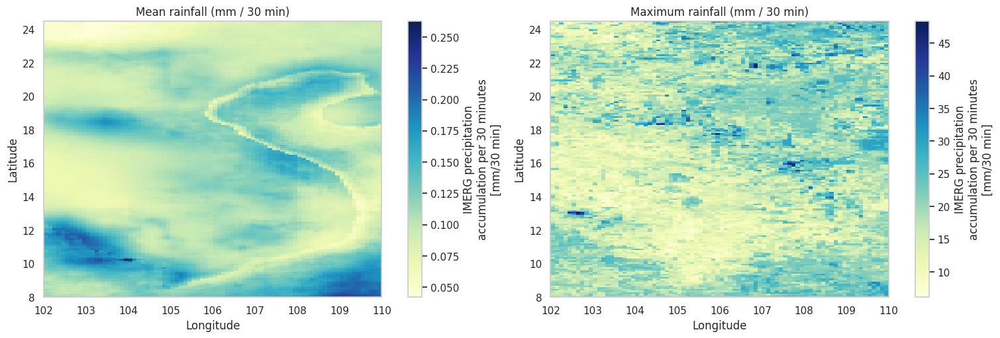

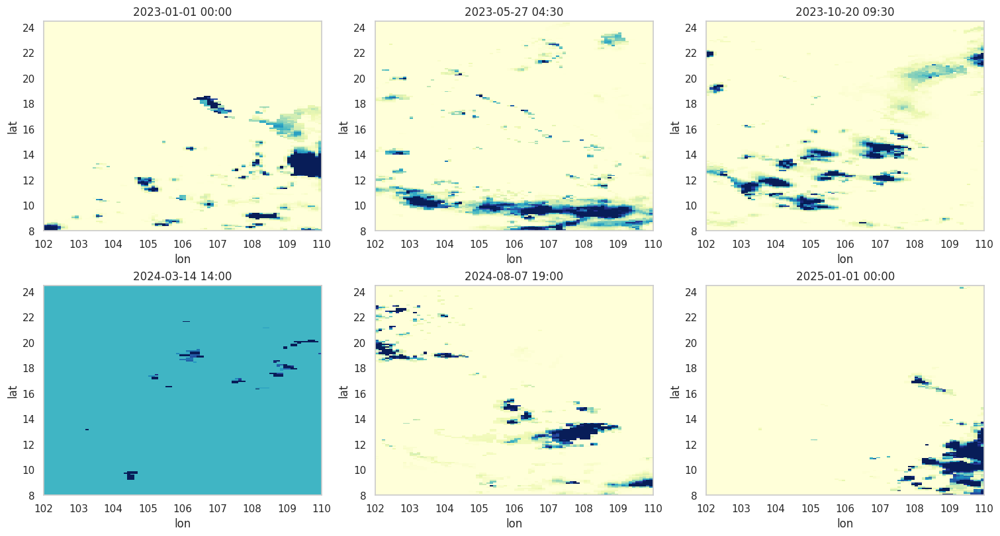

In [5]:
mean_map = rain.mean("time", skipna=True)
max_map = rain.max("time", skipna=True)

fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
for axis, field, title in zip(axes, [mean_map, max_map], ["Mean rainfall", "Maximum rainfall"]):
    image = field.plot(ax=axis, cmap="YlGnBu", add_colorbar=True)
    axis.set_title(f"{title} (mm / 30 min)")
    axis.set_xlabel("Longitude")
    axis.set_ylabel("Latitude")
plt.savefig(FIG_DIR / "rainfall_mean_max_maps.png", dpi=160)
plt.show()

# Chọn 6 mốc cách nhau 30 phút để xem một snapshot của không gian mưa.
sample_indices = np.linspace(0, rain.sizes["time"] - 1, 6, dtype=int)
fig, axes = plt.subplots(2, 3, figsize=(15, 8), constrained_layout=True)
for axis, index in zip(axes.flat, sample_indices):
    rain.isel(time=index).plot(ax=axis, cmap="YlGnBu", vmin=0, robust=True, add_colorbar=False)
    timestamp = pd.Timestamp(rain.time.values[index]).strftime("%Y-%m-%d %H:%M")
    axis.set_title(timestamp)
plt.savefig(FIG_DIR / "rainfall_sample_frames.png", dpi=160)
plt.show()

## 6. (4) Phân tích thời gian

Tính rainfall theo timestep và tổng theo ngày/tháng để tìm thời điểm mưa nhiều. Biểu đồ tháng giúp nhận biết seasonality; danh sách missing timestep ở phần integrity là đầu vào cần theo dõi trước khi tạo sequence cho mô hình.

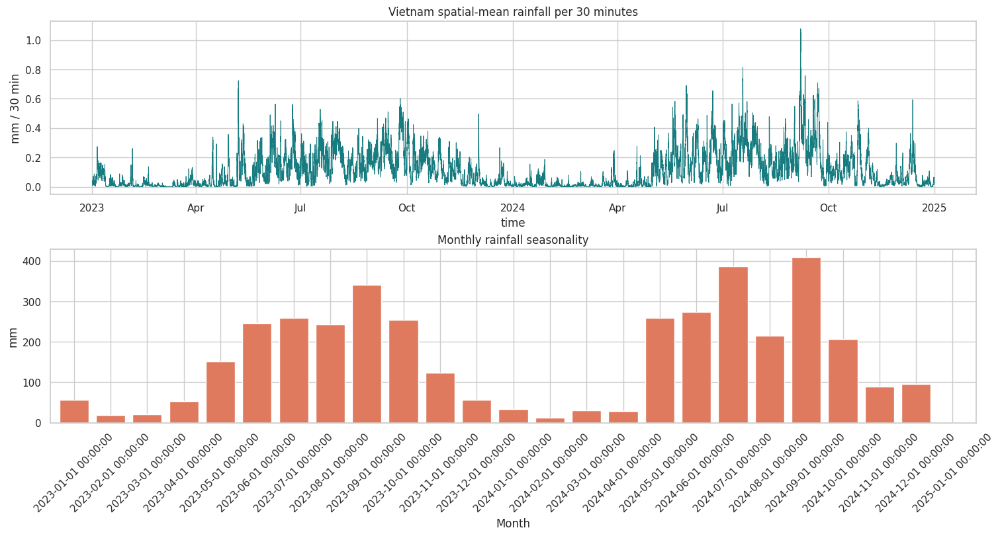

Wettest 10 half-hour timesteps:
time
2024-09-06 22:30:00    1.077185
2024-09-06 21:00:00    1.056008
2024-09-06 23:30:00    1.033609
2024-09-07 00:00:00    1.033499
2024-09-06 23:00:00    1.026262
2024-09-06 20:00:00    1.001491
2024-09-06 20:30:00    0.989942
2024-09-06 19:30:00    0.933059
2024-09-06 21:30:00    0.931648
2024-09-06 19:00:00    0.927620
Name: rainfall, dtype: float32
Wettest 10 days:
time
2024-09-06    30.699953
2024-09-07    27.291969
2024-09-22    26.892578
2024-09-10    26.586695
2024-07-18    24.224518
2023-09-25    23.939976
2023-09-26    22.382126
2024-09-21    22.111511
2024-06-22    22.099920
2024-05-30    21.054838
Name: rainfall, dtype: float32


In [10]:
spatial_mean = rain.mean(dim=("lat", "lon"), skipna=True)
spatial_max = rain.max(dim=("lat", "lon"), skipna=True)
daily_total = rain.resample(time="1D").sum(skipna=True).mean(dim=("lat", "lon"), skipna=True)
monthly_total = daily_total.resample(time="1MS").sum(skipna=True)

fig, axes = plt.subplots(2, 1, figsize=(15, 8), constrained_layout=True)
spatial_mean.plot(ax=axes[0], color="#167c80", linewidth=0.7)
axes[0].set_title("Vietnam spatial-mean rainfall per 30 minutes")
axes[0].set_ylabel("mm / 30 min")
monthly_total.to_series().plot.bar(ax=axes[1], color="#e07a5f", width=0.8)
axes[1].set_title("Monthly rainfall seasonality")
axes[1].set_ylabel("mm")
axes[1].set_xlabel("Month")
axes[1].tick_params(axis="x", rotation=45)
plt.savefig(FIG_DIR / "rainfall_time_series_seasonality.png", dpi=160)
plt.show()

print("Wettest 10 half-hour timesteps:")
print(spatial_mean.sortby(spatial_mean, ascending=False).head(10).to_pandas())
print("Wettest 10 days:")
print(daily_total.sortby(daily_total, ascending=False).head(10).to_pandas())

## 7. (5) Chuỗi frame cho nowcasting

Một mẫu huấn luyện có 6 frame lịch sử: `t-150, t-120, t-90, t-60, t-30, t`; mục tiêu kế tiếp là `t+30, t+60, t+90, t+120`. Cell dưới đây trực quan hóa lịch sử và đo nhanh continuity bằng centroid vùng mưa (`>= 0.1 mm/30 min`) cùng spatial correlation giữa hai frame liên tiếp.

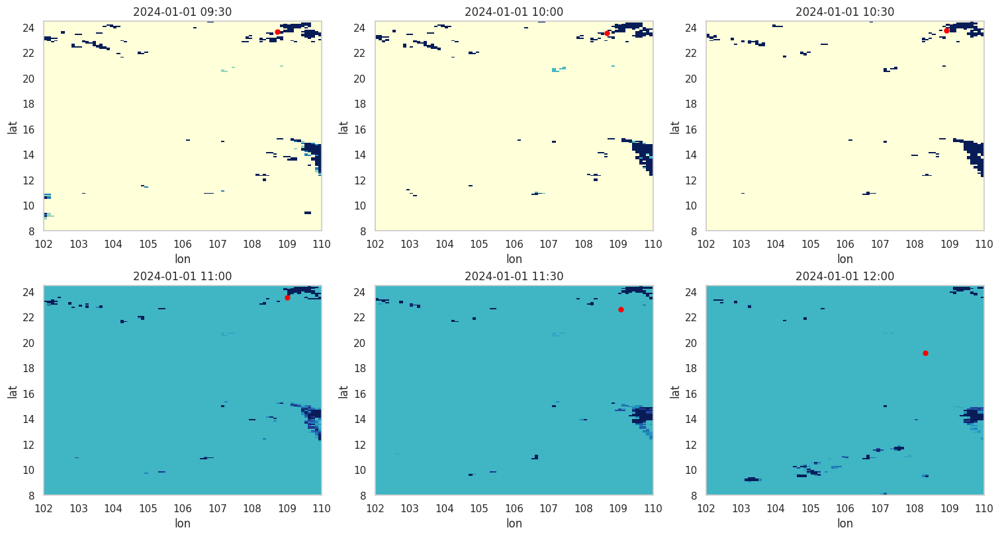

                     centroid_lat  centroid_lon  rainy_pixel_count
time                                                              
2024-01-01 09:30:00     23.666195    108.716003                158
2024-01-01 10:00:00     23.557468    108.670708                153
2024-01-01 10:30:00     23.748308    108.911758                125
2024-01-01 11:00:00     23.533688    109.001190                101
2024-01-01 11:30:00     22.591242    109.070694                103
2024-01-01 12:00:00     19.170650    108.292503                 97


,from,to,spatial_correlation
0,2024-01-01 09:30:00,2024-01-01 10:00:00,0.969537
1,2024-01-01 10:00:00,2024-01-01 10:30:00,0.938192
2,2024-01-01 10:30:00,2024-01-01 11:00:00,0.909772
3,2024-01-01 11:00:00,2024-01-01 11:30:00,0.909898
4,2024-01-01 11:30:00,2024-01-01 12:00:00,0.585246


In [7]:
def centroid_and_area(frame, threshold=0.1):
    mask = frame >= threshold
    count = int(mask.sum(skipna=True))
    if count == 0:
        return np.nan, np.nan, 0
    weights = frame.where(mask).fillna(0)
    total = float(weights.sum())
    latitude = float((weights * frame.lat).sum() / total)
    longitude = float((weights * frame.lon).sum() / total)
    return latitude, longitude, count


def plot_nowcasting_sequence(target_time=None, history_steps=6, threshold=0.1):
    available = pd.DatetimeIndex(pd.to_datetime(rain.time.values))
    if target_time is None:
        target_time = available[len(available) // 2]
    target_time = pd.Timestamp(target_time)
    target_index = int(np.argmin(np.abs(available - target_time)))
    indices = np.arange(target_index - history_steps + 1, target_index + 1)
    indices = indices[(indices >= 0) & (indices < len(available))]

    fig, axes = plt.subplots(2, 3, figsize=(15, 8), constrained_layout=True)
    centroids = []
    for axis, index in zip(axes.flat, indices):
        frame = rain.isel(time=index)
        latitude, longitude, count = centroid_and_area(frame, threshold)
        centroids.append((available[index], latitude, longitude, count))
        frame.plot(ax=axis, cmap="YlGnBu", vmin=0, robust=True, add_colorbar=False)
        axis.set_title(available[index].strftime("%Y-%m-%d %H:%M"))
        if np.isfinite(latitude):
            axis.scatter([longitude], [latitude], color="red", s=25)
    plt.savefig(FIG_DIR / "nowcasting_history_sequence.png", dpi=160)
    plt.show()

    centroid_table = pd.DataFrame(
        centroids, columns=["time", "centroid_lat", "centroid_lon", "rainy_pixel_count"]
    ).set_index("time")
    print(centroid_table)

    correlations = []
    for left, right in zip(indices[:-1], indices[1:]):
        first = rain.isel(time=left).values.ravel()
        second = rain.isel(time=right).values.ravel()
        valid = np.isfinite(first) & np.isfinite(second)
        correlation = np.corrcoef(first[valid], second[valid])[0, 1] if valid.sum() > 2 else np.nan
        correlations.append({"from": available[left], "to": available[right], "spatial_correlation": correlation})
    return centroid_table, pd.DataFrame(correlations)


# Có thể thay bằng một timestamp cụ thể, ví dụ: "2024-09-15 06:00".
centroids, frame_correlations = plot_nowcasting_sequence(target_time=None)
frame_correlations

In [8]:
# Kiểm tra một cửa sổ đầy đủ cho input 6 frame và target 4 frame tương lai.
sequence_length = 6
forecast_horizon = 4
window_size = sequence_length + forecast_horizon
valid_timestep = rain.notnull().all(dim=("lat", "lon")).values
valid_sequence_starts = [
    start_index
    for start_index in range(0, len(valid_timestep) - window_size + 1)
    if valid_timestep[start_index : start_index + window_size].all()
]

print(f"Valid complete sequences (6 history + 4 future): {len(valid_sequence_starts):,}")
print("A sequence with missing pixels/timesteps should be masked, dropped, or imputed explicitly before training.")

Valid complete sequences (6 history + 4 future): 35,080
A sequence with missing pixels/timesteps should be masked, dropped, or imputed explicitly before training.
